# RL experiment for Φ = 3, Ψ = 3 with learning rate decay
Φ = 3, Ψ = 3 corresponds to a strong swimmer with a strong reorienting torque due to vorticity. According to Colabrese et al., these swimmers should form crosses around the vortex centers and make substantial upward progress.  

In [30]:
%run main.ipynb

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [26]:
my_Φ = 3.0 # swimming number = v_s/u_0       
my_Ψ = 3.0  # stability number = B w_0. B is the characteristic time a perturbed cell takes to return 
            # to orientation ka if w = 0. smaller means swimming more aligned with ka. 
my_alpha0 = 1.0 
lr_decay = True
my_omega = 0.5 # exponent in the polynomial decay rate

In [3]:
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords \
            = training(alpha0=my_alpha0, Φ=my_Φ, Ψ=my_Ψ, lr_decay=lr_decay, omega=my_omega)

In [4]:
# directory name for saving files
directory_name = "phi_3_psi_3_lrdecay_omega_0d5"
if os.path.exists('Figures/' + directory_name):
    raise Exception("Warning: this folder already exists")
else:
    os.makedirs('Figures/' + directory_name)

In [5]:
N = 500 # how many episodes to average over 
Ne = 5000

fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(N,Ne+1), y=moving_average(hist_R_tot_smart,N), mode='lines', name = "Smart"))
fig.add_trace(go.Scatter(x=np.arange(N,Ne+1), y=moving_average(hist_R_tot_naive,N), mode='lines', name = "Naive"))
fig.update_layout(
    title="Total reward vs. episode #",
    xaxis_title="Episode #",
    yaxis_title="Total reward, Rtot",
)
fig.show()
fig.write_image("Figures/" + directory_name + "/total-reward.pdf") # save figure

This doesn't seem promising, so let's consider a constant learning rate instead:

In [10]:
my_alpha0 = 0.1
lr_decay = False
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Φ=my_Φ, Ψ=my_Ψ, lr_decay=lr_decay)

In [13]:
# directory for saving figures files
directory_name = "phi_0d3_psi_0d3_alpha_0d1"
create_figure_dir(directory_name)

First we want to see the performance under set of training parameters:

In [15]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 1000)

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 58576
    pid: 1098
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '58576', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




Let's try to probe if we have sufficiently visited each state-action pair. 

The state that was visited least had 156850.0 encounters, which is 0.78% of the total states visited
Pure exploration would have each pair visited  416667.0  times, i.e.  2.08 % of the time


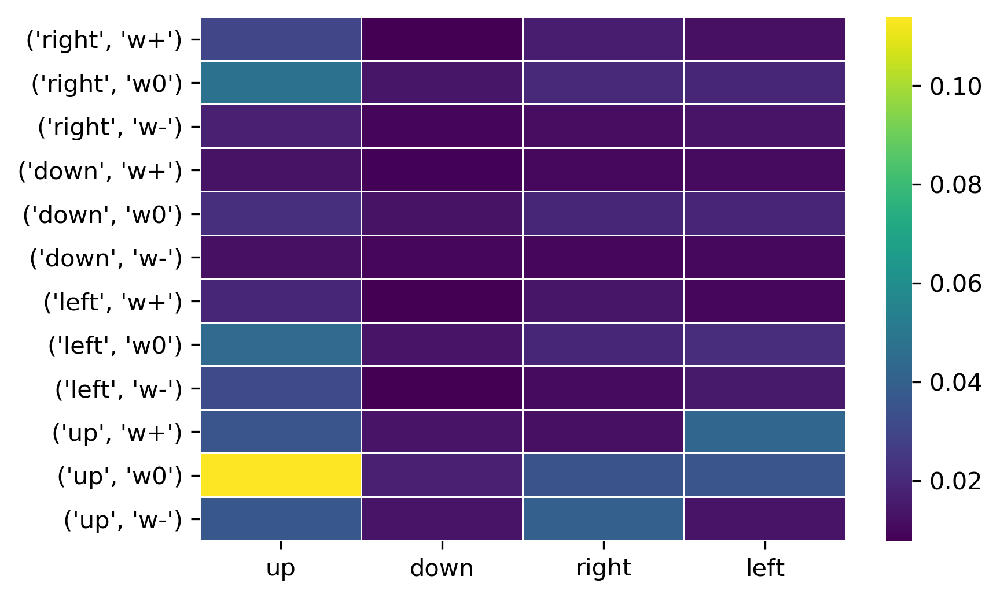

In [16]:
print("The state that was visited least had " + str(np.min(state_action_counter)) + " encounters, which is " + \
     str(round(np.min(state_action_counter)/np.sum(state_action_counter)*100,2)) + "% of the total states visited")
print("Pure exploration would have each pair visited ", np.round(np.sum(state_action_counter)/N_actions/N_states),\
      " times, i.e. ", np.round(1/N_actions/N_states*100,2), "% of the time")
# heatmap normalized by total number of encountersb
ax = sns.heatmap(state_action_counter/np.sum(state_action_counter), linewidth=0.5, \
            xticklabels = ["up","down","right","left"], yticklabels = product_states, cmap = 'viridis')

Besides the one outlier (state 'up'-'w0'), there does not seem to be a large bias in our coverage. How did this performance compare to previous trials? 

In the following trial, we used simple Q learning with a larger learning rate of $\alpha=0.18$ and a purely greedy approach $\epsilon=0$. 

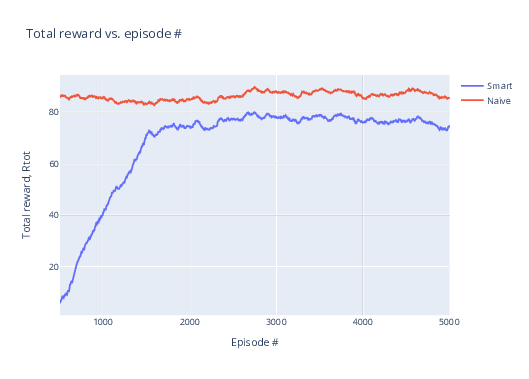

In [11]:
img = WImage(filename='Figures/Φ_3d0_Ψ_3d0_alpha_0d18 (beakeven)/total-reward.pdf')
img

We also conducted an experiment with expected SARSA using a linear decay of $\epsilon$ and the maximal learning rate of 1. 

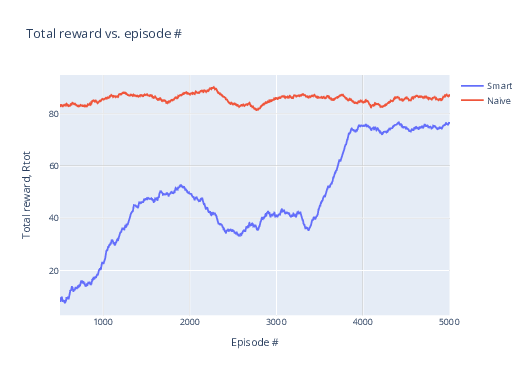

In [9]:
img = WImage(filename='Figures/Φ_3d0_Ψ_3d0_alpha_1d0_expSARSA_epsdecay_eps_1d0/total-reward.pdf')
img

We should be able to reproduce the former even with an $\epsilon$-greedy strategy since Q-learning will learn the optimal policy regardless. Perhaps the additional exploration will prove to be useful. 

In [22]:
my_eps0 = 0.01
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Φ=my_Φ, Ψ=my_Ψ, eps0=my_eps0)

In [23]:
# directory for saving figures files
directory_name = "phi_0d3_psi_0d3_alpha_0d1_eps_0d01"
create_figure_dir(directory_name)

In [24]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 500)

This low performance may be due an excessive amount of exploration since no decay was employed for $\epsilon$. Indeed, we see from the below cell that almost all states are visited equally, with a bias towards states of small vorticity. The latter makes sense since particles should mainly be moving between vortex centers under this set of physical parameters. How do things look if we initialize with this Q matrix and set $\epsilon = 0$?

The state that was visited least had 4732.0 encounters, which is 0.06% of the total states visited
Pure exploration would have each pair visited  166667.0  times, i.e.  2.08 % of the time


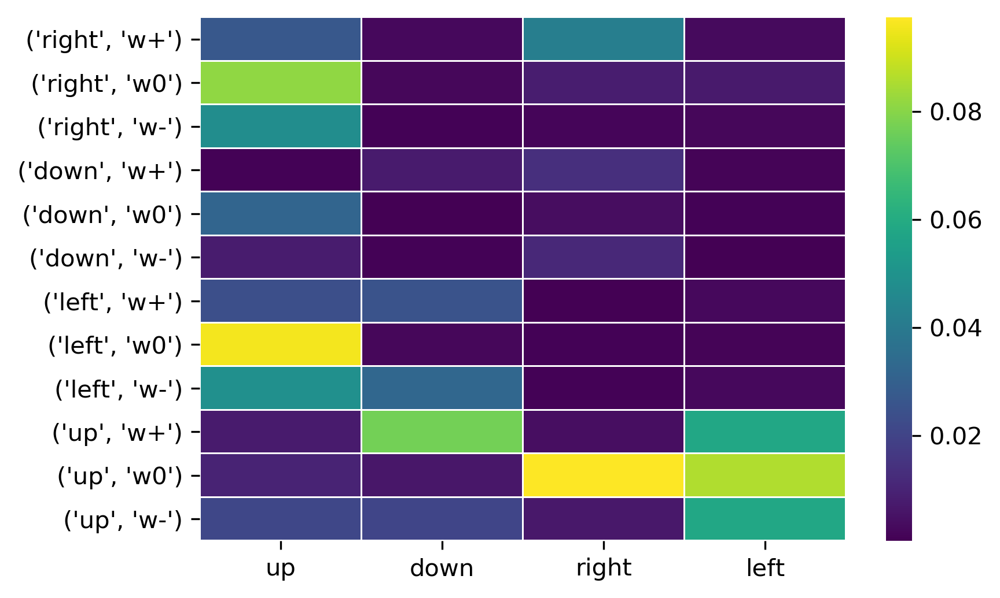

In [34]:
print("The state that was visited least had " + str(np.min(state_action_counter)) + " encounters, which is " + \
     str(round(np.min(state_action_counter)/np.sum(state_action_counter)*100,2)) + "% of the total states visited")
print("Pure exploration would have each pair visited ", np.round(np.sum(state_action_counter)/N_actions/N_states),\
      " times, i.e. ", np.round(1/N_actions/N_states*100,2), "% of the time")
# heatmap normalized by total number of encountersb
ax = sns.heatmap(state_action_counter/np.sum(state_action_counter), linewidth=0.5, \
            xticklabels = ["up","down","right","left"], yticklabels = product_states, cmap = 'viridis')

In [35]:
my_Q = Q
my_eps0 = 0
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(Ne = 5000, alpha0=my_alpha0, Φ=my_Φ, Ψ=my_Ψ, eps0=my_eps0, Qin=my_Q)

In [36]:
# directory for saving figures files
directory_name = "phi_0d3_psi_0d3_alpha_0d1_Ne2000_after_eps_0d01"
create_figure_dir(directory_name)

y


In [37]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 500)

This is an improvement, but still the best trial was simply using Q learning with a learning rate of $\alpha=0.18$ and a purely greedy approach $\epsilon=0$. Let's repeat this but with a larger learning rate of $\alpha=0.4$. Note from the below that $N_s=4000$ is more than enough to reach a "steady state" for $\Phi=3$, $\Psi=3$; hence, let's set $N_s=3000$ and increase $N_e = 7000$ to use our computational time more effectively. 

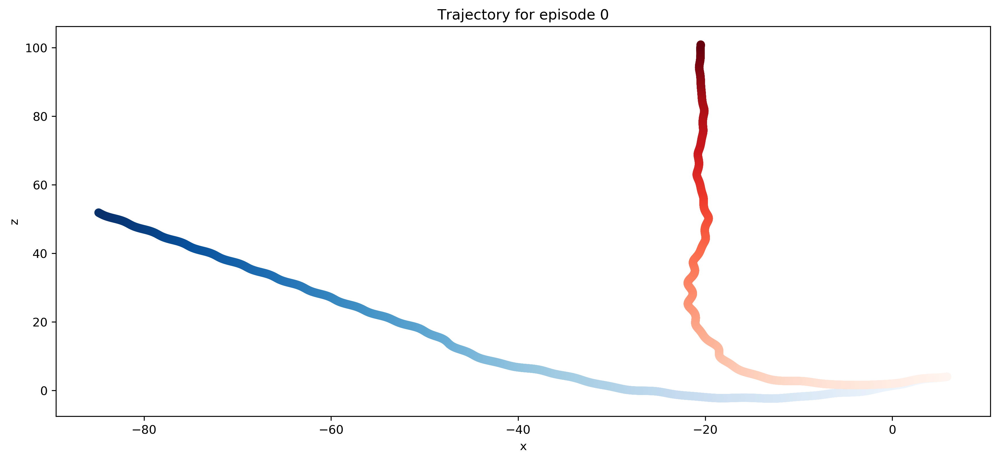

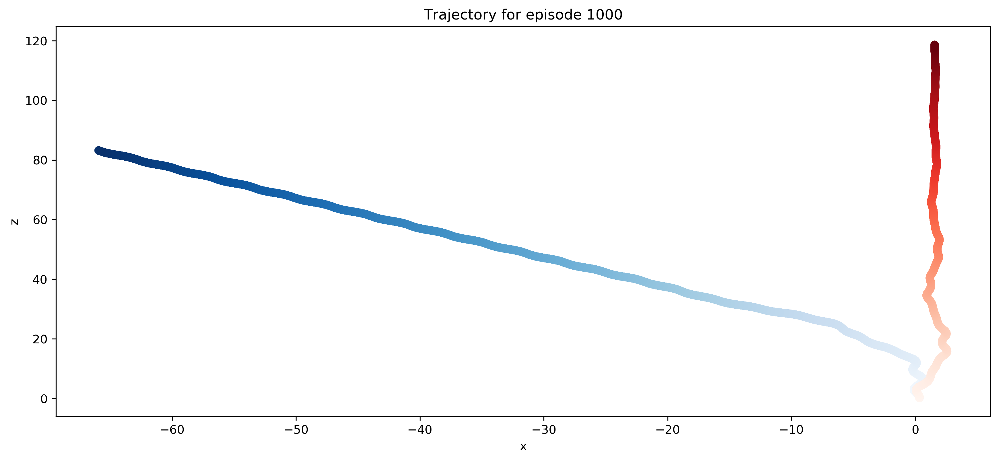

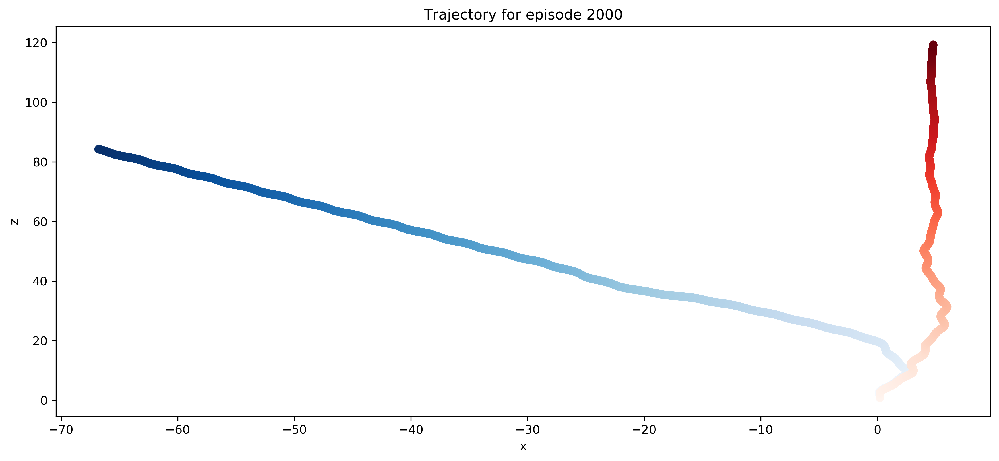

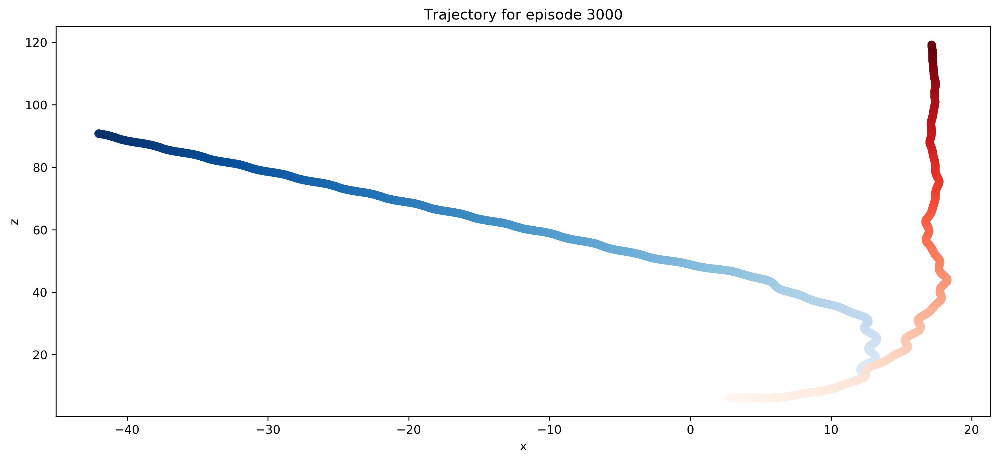

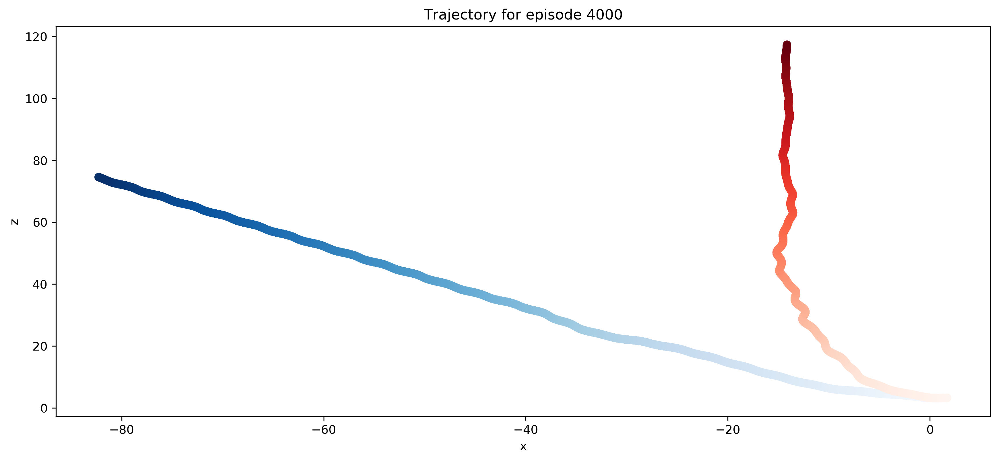

In [39]:
plot_select_trajectories(smart_stored_histories, naive_stored_histories)

In [40]:
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(Ns=3000, Ne=7000, alpha0=0.4, Φ=my_Φ, Ψ=my_Ψ, eps0=0)

In [41]:
# directory for saving figures files
directory_name = "phi_0d3_psi_0d3_alpha_0d4_Ns_3000_Ne_7000"
create_figure_dir(directory_name)

In [55]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 2500)
plot_learning_gain(hist_R_tot_smart, hist_R_tot_naive, N = 2500)

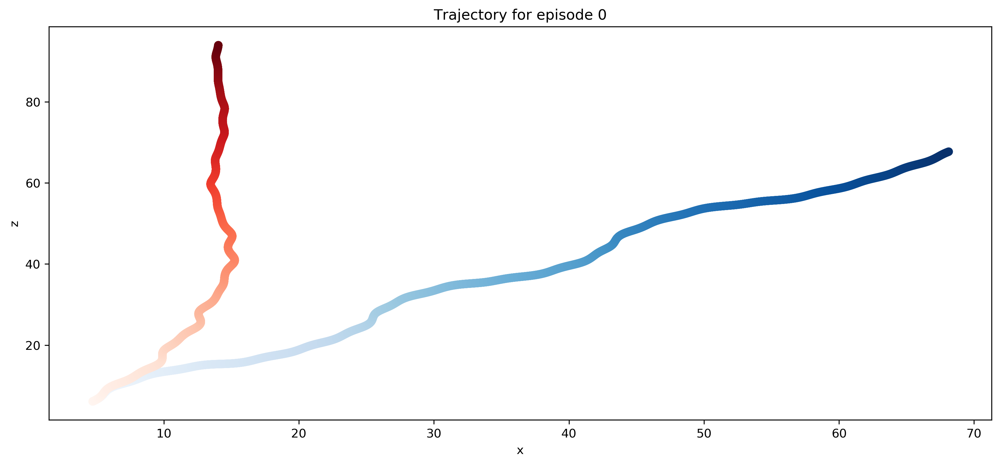

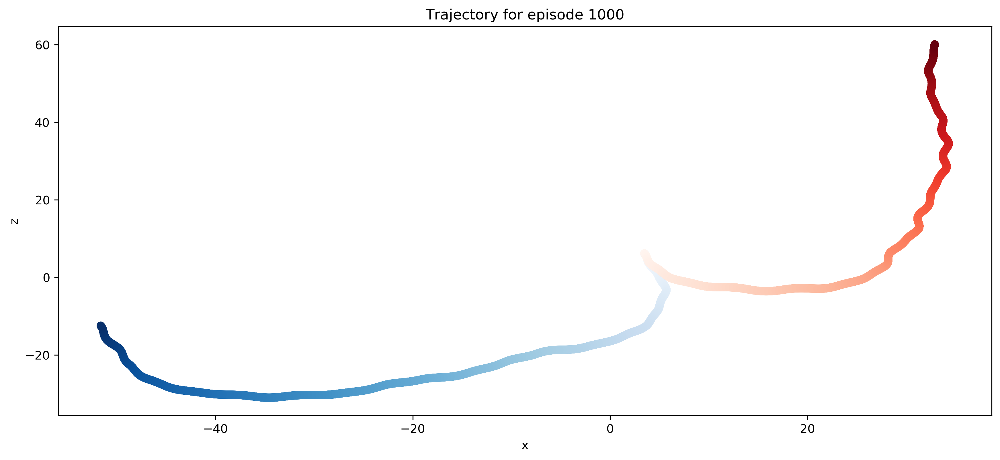

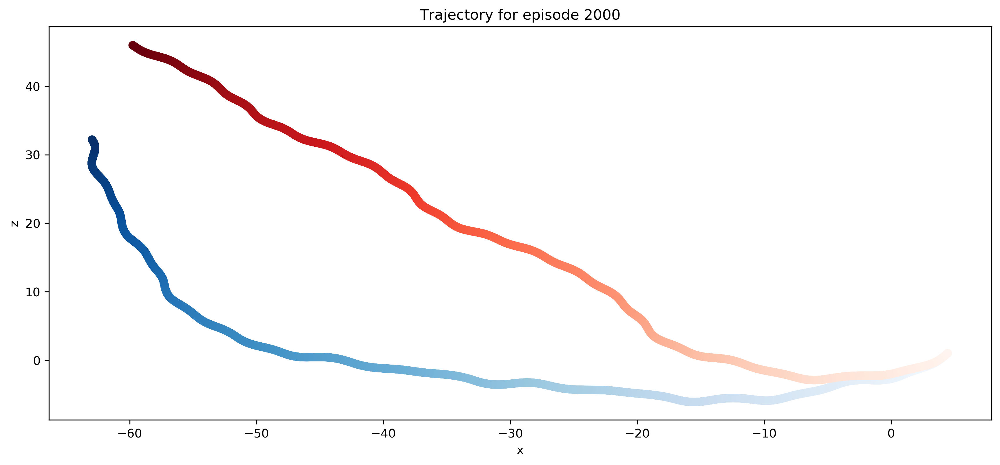

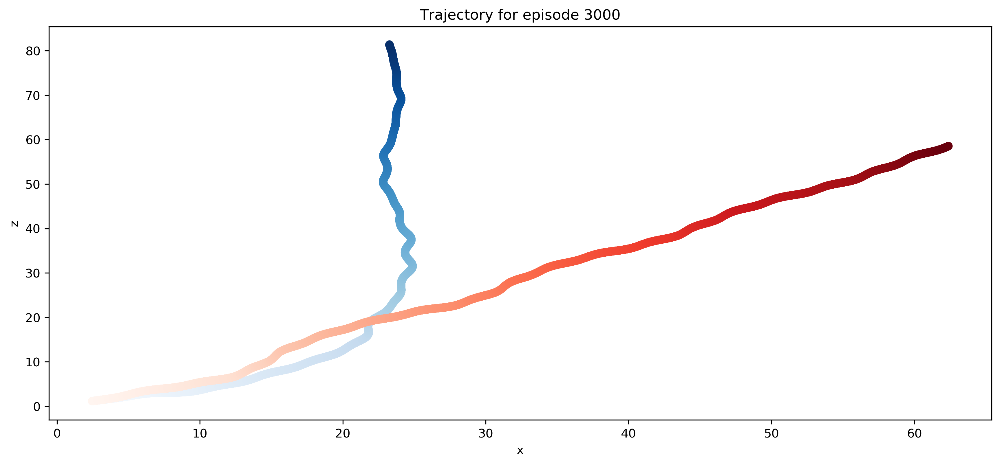

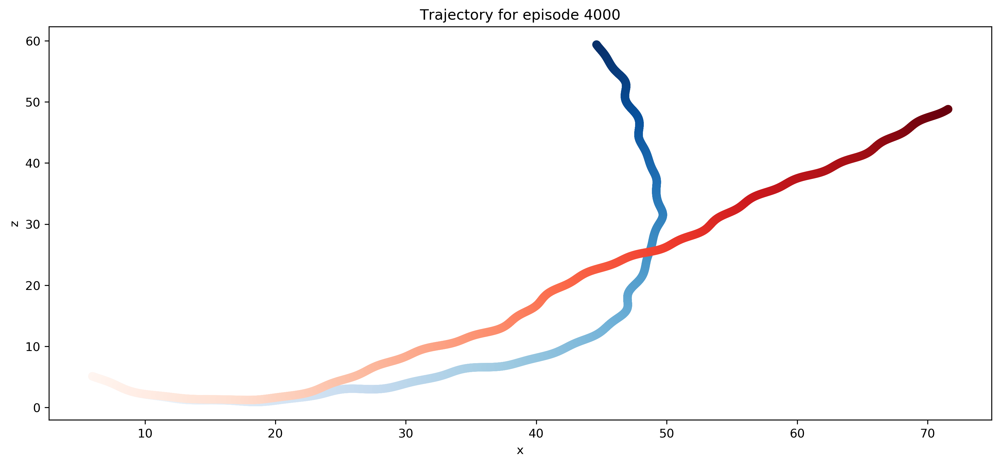

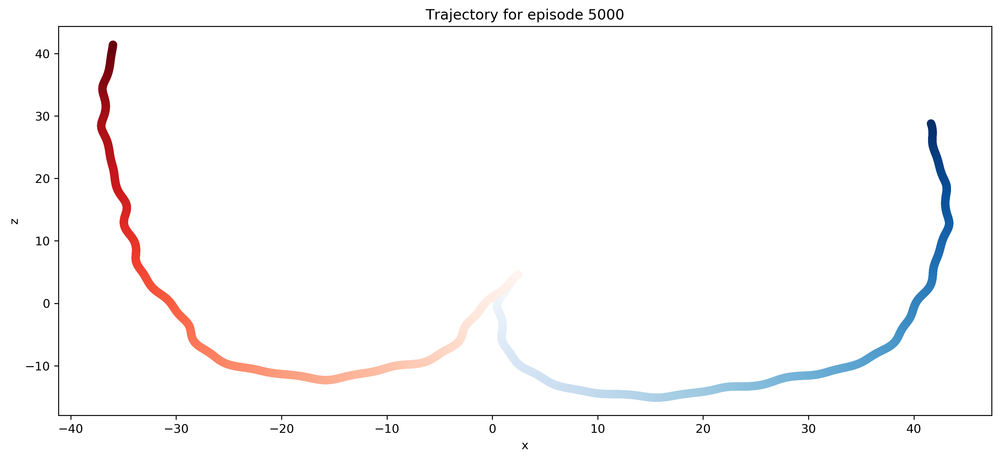

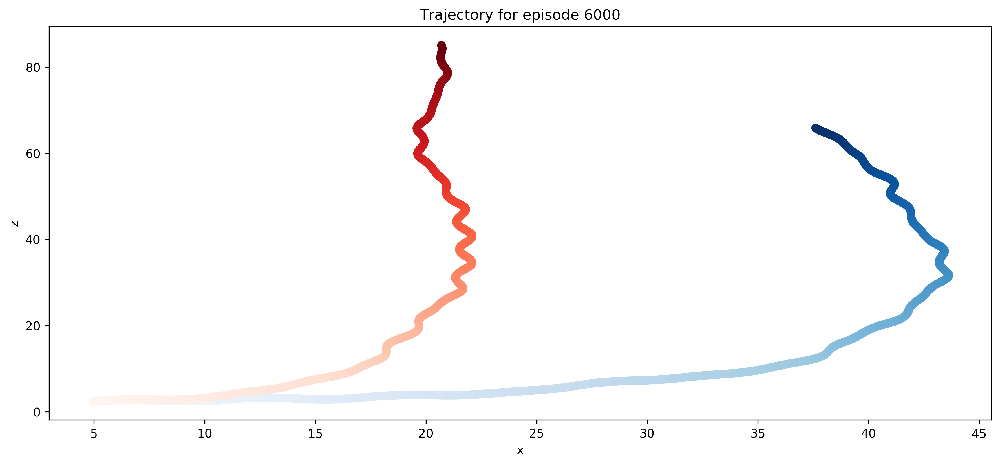

In [51]:
plot_select_trajectories(smart_stored_histories, naive_stored_histories)

We potentially have reached a local minima. We can train for longer (decreasing the learning rate) to test this theory: 

In [56]:
myQ = Q
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(Ns=3000, Ne=7000, alpha0=0.18, Φ=my_Φ, Ψ=my_Ψ, eps0=0, Qin=myQ)

In [57]:
# directory for saving figures files
directory_name = "phi_0d3_psi_0d3_alpha_0d18_Ns_3000_Ne_7000_more"
create_figure_dir(directory_name)

In [58]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 2500)
plot_learning_gain(hist_R_tot_smart, hist_R_tot_naive, N = 2500)